<center> <img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fmiro.medium.com%2Fmax%2F450%2F1*CXZ804tKLPy2hiikJbYH3w.png&f=1&nofb=1" width=25% > </center>

<br><br>

<center> 
    <font size="6">Lab 4: Image Alignment, Image Stitching and Panorama Creation</font>
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59PM, October 4, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Egoitz & Roan</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  15388867 \
Student1 Name: Jose Garcia

Student2 ID: 15735664\
Student2 Name: Lisanne Wallaard

Student3 ID: 11307943\
Student3 Name: Julio Smidi

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import math
import time
import cv2
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import random

from tqdm.notebook import tqdm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy import signal
from matplotlib.patches import ConnectionPatch

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 4 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Image Alignment (55 points)](#section-1)
  - [Question 1 (5 points)](#question-1)
  - [Question 2 (10 points)](#question-2)
  - [Question 3 (15 points)](#question-3)
  - [Question 4 (5 points)](#question-4)
  - [Question 5 (5 points)](#question-5)
  - [Question 6 (3 points)](#question-6)
  - [Question 7 (5 points)](#question-7)
  - [Question 8 (7 points)](#question-8)
  
- [Section 2: Image Stitching (30 points)](#section-2)
  - [Question 9 (20 points)](#question-9)
  - [Question 10 (5 points)](#question-10)
  - [Question 11 (5 points)](#question-11)
  
- [Section 3: Automatic Panorama Stitching (15 points)](#section-3)
  - [Question 12 (15 points)](#question-12)
  
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Image Alignment**

In this section, you will develop a function that computes the affine transformation between two images. The goal is to align two supplied images from *Genoa Beach* by following a series of steps that involve detecting interest points, characterizing their local appearances, and matching these regions between the images. This process is fundamental in many computer vision tasks, such as object recognition, image stitching, and motion tracking.

The overall procedure is outlined as follows:

1. **Detect Interest Points:**
   - Identify key points in each image that are likely to be matched between the two images.

2. **Characterize Local Appearance:**
   - Describe the local appearance around each interest point using a region descriptor.

3. **Find Matches:**
   - Match the region descriptors between the two images to identify corresponding points. You can use David Lowe's SIFT (Scale-Invariant Feature Transform) for these steps. SIFT is a powerful method for detecting and describing local features in images. For further information, refer to the [SIFT tutorial](https://docs.opencv.org/3.4.2/da/df5/tutorial_py_sift_intro.html) and the [SIFT class documentation](https://docs.opencv.org/3.4.2/d5/d3c/classcv_1_1xfeatures2d_1_1SIFT.html).

4. **Perform RANSAC (Random Sample Consensus):**
   - To find the best transformation, perform the following steps:
     - **Repeat N times:**
       - Randomly select a set of P matched pairs from the total set of matches.
       - Construct a matrix A and vector b using the P pairs of points. Solve for the affine transformation parameters \((m1, m2, m3, m4, t1, t2)\) by solving the equation \(Ax = b\). This equation can be solved using the pseudo-inverse \(x = (A^T A)^{-1} A^T b\) or by using Python's Numpy package.
       - Apply the transformation to all matched points in the first image. If the transformation is accurate, the transformed points should lie close to their corresponding points in the second image.
       - Count the number of inliers, where inliers are defined as points from the first image that, when transformed, lie within a radius of 10 pixels from their corresponding points in the second image.
       - If the number of inliers exceeds the best count so far, save the transformation parameters and the set of inliers.

5. **Visualize RANSAC Performance:**
   - Plot the two images side by side and draw lines connecting the original points in the first image with their corresponding transformed points in the second image.

6. **Transform the First Image:**
   - Use the final set of transformation parameters to transform the first image. The transformed image should align with the second image. Implement this transformation using **nearest-neighbor interpolation**. Additionally, use OpenCV's built-in function `cv2.warpAffine` to compare results. Note that nearest-neighbor interpolation involves rounding the coordinates of the transformed points, which is simpler to implement than linear interpolation.


<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (5 points)</font>

Create a function named **get_matching_keypoints()** that takes two images as input and returns the matching keypoints between them.

The function should use the SIFT (Scale-Invariant Feature Transform) algorithm to detect and describe keypoints in both images. Once the keypoints are detected, use a brute-force matcher with Euclidean distance to find and return the matches between the two images. Make sure to convert the images to grayscale for processing.

The function should return the keypoints detected in the first image, the keypoints detected in the second image, and the matches found between them. Ensure that the function prints the number of keypoints detected in each image, as well as the number of matches found.

To test your function, use the images `genoa_beach.jpg` and `genoa_beach_cut_1.jpg`.

**Note**: You can use the OpenCV library to implement the SIFT algorithm.

In [4]:
def get_matching_keypoints(image_1, image_2):
    """
    Given two input images, find and return the matching keypoints.

    Args:
        image_1: The first image (in RGB)
        image_2: The second image (in RGB)

    Returns:
        keypoints_image_1: Keypoints detected in the first image
        keypoints_image_2: Keypoints detected in the second image
        matches: Matching keypoints between the two images
    """

    print('Finding matching features...')

    # Convert to grayscale
    image_1_gray = cv2.cvtColor(image_1, cv2.COLOR_RGB2GRAY)
    image_2_gray = cv2.cvtColor(image_2, cv2.COLOR_RGB2GRAY)

    # Find keypoints and descriptors using SIFT
    sift = cv2.SIFT_create()
    keypoints_image_1, descriptors_image_1 = sift.detectAndCompute(image_1_gray, None)
    keypoints_image_2, descriptors_image_2 = sift.detectAndCompute(image_2_gray, None)

    # Use a brute-force matcher using Euclidean Distance to find the matches between the images
    brute_force = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = brute_force.match(descriptors_image_1, descriptors_image_2)
    # matches = sorted(matches, key=lambda x: x.distance)

    # Output the number of keypoints and matches
    print(f"Number of keypoints in the first image:  {len(keypoints_image_1)}")
    print(f"Number of keypoints in the second image: {len(keypoints_image_2)}")
    print(f"Number of matches: {len(matches)}")

    return keypoints_image_1, keypoints_image_2, matches

In [5]:
image_1_bgr = cv2.imread("./images/genoa_beach.jpg")
image_1 = cv2.cvtColor(image_1_bgr, cv2.COLOR_BGR2RGB)

image_2_bgr = cv2.imread("./images/genoa_beach_cut_1.jpg")
image_2 = cv2.cvtColor(image_2_bgr, cv2.COLOR_BGR2RGB)

keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(image_1, image_2)

Finding matching features...
Number of keypoints in the first image:  14514
Number of keypoints in the second image: 10245
Number of matches: 6416


<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (10 points)</font>

Create a function named `draw_random_matches` that takes the matching keypoints found in Question 1, selects a random subset of 10 matching points, and plots them on the images.

The function should connect matching pairs with lines, assigning a random color to each line to make them easier to distinguish. Ensure that the keypoints are marked on both images and that the matching lines are clearly visible. The images should be displayed side by side for easy comparison.

**Hint:** Use `from matplotlib.patches import ConnectionPatch` for drawing the lines between matching keypoints.

In [6]:
def draw_random_matches(image_1, keypoints_1, image_2, keypoints_2, matches, subset_size=10):
    """
    Draw a random subset of matching keypoints between two images.

    Args:
        image_1: The first image (in RGB)
        keypoints_1: Keypoints detected in the first image
        image_2: The second image (in RGB)
        keypoints_2: Keypoints detected in the second image
        matches: Matching keypoints between the two images
        subset_size: Number of random matches to display (default is 10)

    Returns:
        None. The function displays the images with the matching keypoints.
    """

    # Display the images side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(image_1)
    axes[0].axis('off')  
    axes[1].imshow(image_2)
    axes[1].axis('off')  

    # Draw a random subset of matches given by subset_size
    random_subset = random.sample(matches, subset_size)
    for match in random_subset:
        # Geth the x and y coordinates of the matching keypoints
        key_1_i = match.queryIdx
        key_2_i = match.trainIdx
        (x_1, y_1) = keypoints_1[key_1_i].pt
        (x_2, y_2) = keypoints_2[key_2_i].pt

        # Draw the matching keypoints
        axes[0].scatter(x_1, y_1, color='red', s=60, edgecolor='black')
        axes[1].scatter(x_2, y_2, color='red', s=60, edgecolor='black')

        # Draw the lines connecting the matching keypoints
        connection_0 = ConnectionPatch(xyA=(x_1, y_1), xyB=(x_2, y_2), coordsA=axes[0].transData, coordsB=axes[1].transData, 
                                       color=np.random.rand(3,), linewidth=2, linestyle='-')
        axes[0].add_artist(connection_0)
        connection_1 = ConnectionPatch(xyA=(x_1, y_1), xyB=(x_2, y_2), coordsA=axes[0].transData, coordsB=axes[1].transData, 
                                       color=np.random.rand(3,), linewidth=2, linestyle='-')
        axes[1].add_artist(connection_1)
        
    plt.show()

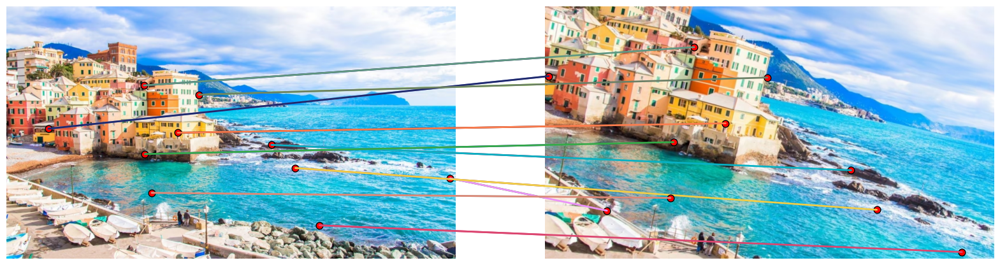

In [7]:
draw_random_matches(image_1, keypoints_image_1, image_2, keypoints_image_2, matches, subset_size=10)

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (15 points)</font>

In this question, you will implement the RANSAC algorithm to filter out outlier matches between two sets of keypoints by fitting a affine transformation model. You have to complete the following functions:

1. **compute_affine_transformation_matrix:** This function takes a set of point correspondences and computes a affine transformation matrix using those points.
2. **test_affine_transformation_matrix:** This function tests the computed affine transformation matrix on a set of point correspondences and identifies the inliers based on a given threshold.
3. **ransac_algorithm:** This function applies the RANSAC algorithm to find the best affine transformation matrix by repeatedly sampling points and testing the model.

**Note**: You are only allowed to use the Numpy library to implement these functions.

In [8]:
def compute_affine_transformation_matrix(data):
    """
    Compute a affine transformation matrix using a set of point correspondences.

    Args:
        data: An array containing point correspondences between two images.

    Returns:
        transformation_matrix: A affine transformation matrix.
    """

    # Extract the corresponding keypoint coordinates from the data
    keypoints_1 = data[:, :2]  
    keypoints_2 = data[:, 2:]  

    A = []
    b = []
    # Construct matrix A and vector b using the keypoint correspondences
    for i in range(keypoints_1.shape[0]):
        x_1, y_1 = keypoints_1[i]
        x_2, y_2 = keypoints_2[i]
        A.append([x_1, y_1, 0, 0, 1, 0])  
        A.append([0, 0, x_1, y_1, 0, 1])  
        b.append(x_2)                    
        b.append(y_2)                    

    A = np.array(A)
    b = np.array(b)

    # Solve for the affine transformation parameters
    transform_params = np.linalg.pinv(A).dot(b)  
    m1, m2, m3, m4, t1, t2 = transform_params

    transformation_matrix = np.array([[m1, m2, t1], 
                                      [m3, m4, t2]])

    return transformation_matrix

In [9]:
def test_affine_transformation_matrix(transformation_matrix, data, threshold=10):
    """
    Test the affine transformation matrix on a set of point correspondences 
    and identify inliers.

    Args:
        transformation_matrix: A affine transformation matrix.
        data: An array containing point correspondences.
        threshold: The distance threshold to consider a transformed point as 
                   an inlier. Default is 10.

    Returns:
        inliers: A list of indices of the inliers within the input data.
    """

    inliers = []
    
    # Extract the corresponding keypoint coordinates from the data
    keypoints_1 = data[:, :2]
    keypoints_2 = data[:, 2:]

    for i in range(len(keypoints_1)):
        # Transform to homogeneous coordinates
        keypoint_1 = np.array([keypoints_1[i][0], keypoints_1[i][1], 1])
        
        # Apply affine transformation
        keypoint_2 = transformation_matrix @ keypoint_1

        # Calculate the Euclidean distance between the transformed keypoint and the actual keypoint
        radius = np.linalg.norm(keypoint_2[:2] - keypoints_2[i])

        # Check if the radius is within the threshold
        if radius < threshold:
            inliers.append(i)


    return inliers

In [10]:
def ransac_algorithm(keypoints_1, keypoints_2, matches, num_iterations, num_points=3, threshold=10):
    """
    Apply the RANSAC algorithm to filter out outlier matches between two sets of 
    keypoints by fitting a affine transformation model.

    Args:
        keypoints_1: The keypoints from the first image.
        keypoints_2: The keypoints from the second image.
        matches: A list of matches between keypoints_1 and keypoints_2.
        num_iterations: The number of iterations for the RANSAC algorithm.
        num_points: The number of points to randomly sample in each iteration 
                    to fit the model. Default is 3.
        threshold: The distance threshold to consider a matched pair as an 
                   inlier. Default is 10.

    Returns:
        best_transformation_matrix: The best transformation matrix found by RANSAC. 
                                    None may be returned if the matrix cannot be computed.
    """
    num_best_inliers = 0
    best_transformation_matrix = None
    best_inliers = []

    # Transform the matching keypoints coordinates into a numpy array
    data = np.array([[keypoints_1[match.queryIdx].pt[0], keypoints_1[match.queryIdx].pt[1],
                      keypoints_2[match.trainIdx].pt[0], keypoints_2[match.trainIdx].pt[1]]
                      for match in matches])

    for i in range(num_iterations):
        # Randomly sample keypoints from the data given by num_points
        sample_i = random.sample(range(len(data)), num_points)
        sample_keypoints = data[sample_i]
        
        # Compute the affine transformation matrix
        transformation_matrix = compute_affine_transformation_matrix(sample_keypoints)

        # Identify the inliers
        inliers = test_affine_transformation_matrix(transformation_matrix, data, threshold)
        num_inliers = len(inliers)

        # Update the best transformation matrix & inliers if the current number of inliers is greater
        if num_inliers > num_best_inliers:
            num_best_inliers = num_inliers
            best_transformation_matrix = transformation_matrix
            best_inliers = inliers

    # Print information
    print("Total number of matches: ", len(matches))
    print("Inliers found:           ", len(best_inliers))
    print("Outliers removed:        ", len(matches) - num_best_inliers)

    return best_transformation_matrix

In [11]:
num_iterations = 30
num_points = 5
threshold = 10

best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations, num_points, threshold)

# Print the best matrix
print(f'\nBest matrix:\n{best_transformation_matrix}')

Total number of matches:  6416
Inliers found:            5423
Outliers removed:         993

Best matrix:
[[ 1.11555173e+00 -2.61056360e-01 -4.21436300e+01]
 [ 2.60503940e-01  1.11480142e+00 -3.11963908e+02]]


<a id="question-5"></a>
#### <font color='#FF0000'>Question 4 (5 points)</font>

In this question, you will implement an affine transformation on an image using the transformation matrix obtained from the RANSAC algorithm in the previous question.

Create a function named `apply_affine_transformation` that takes an image and a 2x3 affine transformation matrix as input. The function should perform the affine transformation using either forward or inverse warping, based on the specified method.

Ensure that the transformed image maintains the same dimensions as the input image. The function should handle cases where the transformed coordinates go out of bounds by ignoring those pixels. You can use the resulting transformation matrix from Question 4 as the input for this function.

**Note**: You are only allowed to use the Numpy library to implement this function.

In [12]:
def apply_affine_transformation(image, transformation_matrix, warp_method='forward'):
    """
    Perform an affine transformation on an image.

    Args:
        image: Input image, expected shape (height, width, [channels])
        transformation_matrix: 2x3 affine transformation matrix
        warp_method: Either 'forward' or 'inverse' for the desired warping method. Default is 'forward'.

    Returns:
        transformed_image: Transformed image of the same shape as input
    """
    
    height, width = image.shape[:2]
    transformed_image = np.zeros_like(image)
    
    if warp_method == 'forward':
        for h in range(height):
            for w in range(width):
                # Apply the transformation matrix to the original coordinates
                orig_coords = np.array([w, h, 1])
                new_coords = transformation_matrix @ orig_coords
                
                # Round the new coordinates to the nearest integer
                new_w, new_h = new_coords[:2]
                new_w, new_h = int(round(new_w)), int(round(new_h))

                # Check if the new coordinates are within the bounds of the image
                if 0 <= new_w < width and 0 <= new_h < height:
                    transformed_image[new_h, new_w] = image[h, w]

    elif warp_method == 'inverse':
        for h in range(height):
            for w in range(width):
                # Apply the inverse transformation matrix to the new coordinates
                orig_coords = np.linalg.pinv(np.vstack([transformation_matrix, [0, 0, 1]])) @ np.array([w, h, 1])
                
                # Round the original coordinates to the nearest integer
                orig_w, orig_h = orig_coords[:2]
                orig_w, orig_h = int(round(orig_w)), int(round(orig_h))

                # Check if the original coordinates are within the bounds of the image
                if 0 <= orig_w < width and 0 <= orig_h < height:
                    transformed_image[h, w] = image[orig_h, orig_w]

    return transformed_image

<a id="question-6"></a>
#### <font color='#FF0000'>Question 5 (5 points)</font>

Create a function named **visualize_affine_transformations()** that takes the source image, reference image, and the best transformation matrix as inputs, and visualizes the results using four different methods: forward warping, inverse warping, OpenCV’s `warpAffine`, and the original reference image.

The function should display the results in a 2x4 grid of subplots:
- The first row will display the full images transformed by each method.
- The second row will display a zoomed-in section of each transformation for closer inspection.

Ensure that the subplots are well-labeled and that the zoomed-in sections provide a clear view of the differences between the methods.

In [13]:
def visualize_affine_transformations(source_image, reference_image, transformation_matrix):
    """
    Compare different affine transformation methods in a 2x4 grid visualization.

    Args:
        source_image: Source image to transform
        reference_image: Reference image to compare against
        transformation_matrix: Best transformation matrix

    Returns:
        None. Displays a plot without returning a value.
    """

    # forward warp
    forward_wrap_image = apply_affine_transformation(source_image, transformation_matrix)

    # inverse warp
    inverse_wrap_image = apply_affine_transformation(source_image, transformation_matrix, warp_method='inverse')

    # opencv warpAffine
    cv2_wrap_image = cv2.warpAffine(source_image, transformation_matrix, (source_image.shape[1], source_image.shape[0]))

    # Create subplots for visualization
    plt.figure()
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle('Affine Transformations: Full Images and Zoomed-in Sections', fontsize=16)

    # Display full images
    axes[0, 0].imshow(forward_wrap_image)
    axes[0, 0].set_title('Forward Warping')

    axes[0, 1].imshow(inverse_wrap_image)
    axes[0, 1].set_title('Inverse Warping')

    axes[0, 2].imshow(cv2_wrap_image)
    axes[0, 2].set_title('OpenCV Warp')

    axes[0, 3].imshow(reference_image)
    axes[0, 3].set_title('Reference Image')

    zoom_size = 150
    zoom_y, zoom_x = source_image.shape[0] // 2, source_image.shape[1] // 2
    zoom_region = (slice(zoom_y - zoom_size // 2, zoom_y + zoom_size // 2), slice(zoom_x - zoom_size // 2, zoom_x + zoom_size // 2))

    # Display zoomed-in sections
    axes[1, 0].imshow(forward_wrap_image[zoom_region])
    axes[1, 0].set_title('Zoomed Forward')

    axes[1, 1].imshow(inverse_wrap_image[zoom_region])
    axes[1, 1].set_title('Zoomed Inverse')

    axes[1, 2].imshow(cv2_wrap_image[zoom_region])
    axes[1, 2].set_title('Zoomed OpenCV')

    axes[1, 3].imshow(reference_image[zoom_region])
    axes[1, 3].set_title('Zoomed Reference')

    # Hide axis ticks for all subplots
    for ax in axes.flat:
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)

Finding matching features...
Number of keypoints in the first image:  14514
Number of keypoints in the second image: 10245
Number of matches: 6416
Total number of matches:  6416
Inliers found:            5425
Outliers removed:         991


<Figure size 640x480 with 0 Axes>

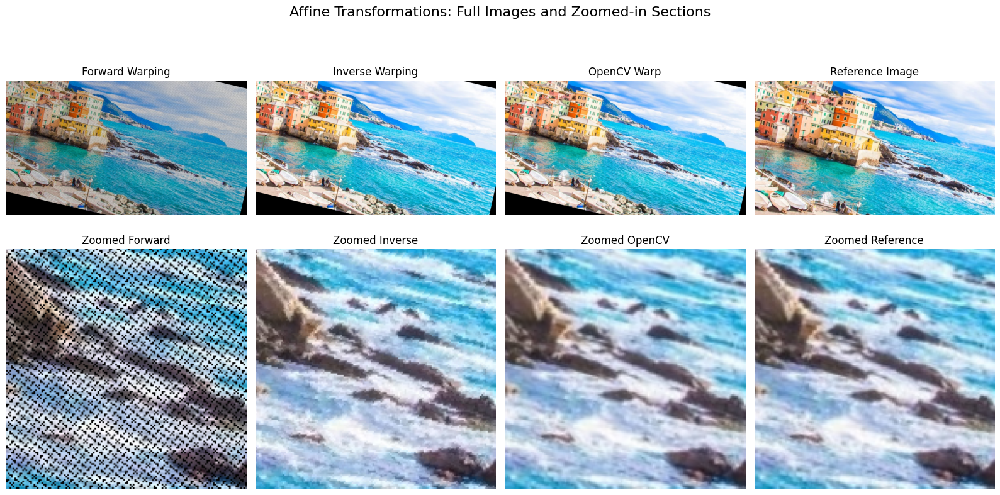

In [14]:
num_iterations = 30
num_points = 3
threshold = 10

source_image = cv2.cvtColor(cv2.imread("./images/genoa_beach.jpg"), cv2.COLOR_BGR2RGB)
reference_image = cv2.cvtColor(cv2.imread("./images/genoa_beach_cut_1.jpg"), cv2.COLOR_BGR2RGB)

keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(source_image, reference_image)
best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations, num_points, threshold)

visualize_affine_transformations(source_image, reference_image, best_transformation_matrix)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (3 points)</font>

How many matches are required to solve an affine transformation formulated as follows:

$
\begin{bmatrix}
x'\\y'
\end{bmatrix} =
\begin{bmatrix}
m_1 & m_2\\
m_3 & m_4
\end{bmatrix}
\begin{bmatrix}
x\\y
\end{bmatrix} +
\begin{bmatrix}
t_1\\t_2
\end{bmatrix}
$

This equation can be rewritten as:

$
\begin{bmatrix}
x&y&0&0&1&0\\
0&0&x&y&0&1
\end{bmatrix}
\begin{bmatrix}
m_1\\
m_2\\
m_3\\
m_4\\
t_1\\
t_2
\end{bmatrix} =
\begin{bmatrix}
x'\\y'
\end{bmatrix}
$

Alternatively:

$
Ax = b, \;
A = \begin{bmatrix}
x&y&0&0&1&0\\
0&0&x&y&0&1
\end{bmatrix}, \;
x = \begin{bmatrix}
m_1\\
m_2\\
m_3\\
m_4\\
t_1\\
t_2
\end{bmatrix}, \;
b = \begin{bmatrix}
x'\\y'
\end{bmatrix}
$

##### <font color='yellow'>Answer:</font>

To solve the affine transformation problem, we need to determine the six unknown parameters of vector X, and to do that, we need a sufficient number of equations.

Each match between corresponding points (x, y) and (x', y') provides two equations:

1.  x' = m_1 * x + m_2 * y + t_1
2.  y' = m_3 * x + m_4 * y + t_2 

Since there are **six unknowns** in total and each point's match provides **two equations**, the minimum number of matches required is **3**, which is exactly the number provided in the code above for implementing the algorithm.

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (5 points)</font>

What happens if we have more point matches than the minimum required for solving an affine transformation? Will the code still work, and why?

##### <font color='yellow'>Answer:</font>

If we have more point matches than the minimum required, the system becomes overdetermined, meaning that there are more equations (and solutions) than unknowns. For those cases, we can't solve the system exactly for all points, but we can find an approximate solution. More importantly, when implementing the methods $ X = (A^T A)^{-1} A^T b $ or the np.linalg.pinv function, this is already being taken into consideration. The code will still work because most these solvers are designed to handle overdetermined systems. 

- For $ X = (A^T A)^{-1} A^T b $, the equation is a solution to the least-squares errors problem, which is obtained by minimizing $||Ax−b||^2 $.
- The $ np.linalg.pinv(A) b $ method also works because it calculates the least-squares solution to the $ A*x = b $ system using the pseudoinverse matrix of A.

Because we can solve overdetermined systems, the process results in a more robust solution, especially when some of the point matches are noisy or have some imperfections.

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (7 points)</font>

How many iterations are required in RANSAC to reliably find the correct transformation parameters? Provide a detailed explanation, and use mulitple figures to support your answer.

##### <font color='yellow'>Answer:</font>

The number of iterations required in RANSAC to reliably find the correct transformation parameters depends on the desired probability of success $ p $, the ratio of inliers to total data points $ w $, and the number of points $ n $ needed to estimate the transformation model [[1]]. The formula to calculate the required iterations is:

$$ k = \frac{\log(1 - p)}{\log(1 - w^n)} $$

Where:

- $ p $ is the desired probability of success,
- $ w $ is the inlier ratio (calculated as the number of inliers divided by the total number of points),
- $ n $ is the number of points needed to estimate the model.

This formula gives the number of iterations needed to ensure that at least one iteration selects only inliers, which results in an accurate model.

#### Experimenting with Parameters

In our case, we manipulate the `num_iterations`, `threshold`, and `points` parameters in our functions. The threshold controls how far can a point be from the estimated point and still be considered an inlier. A higher threshold includes more points as inliers but risks including incorrect transformations. The number of iterations affects how likely we are to find a valid transformation.

For the **genoa_beach** images, we have 6416 point matches in total. A threshold of 10 eliminates 993 outliers, leaving 5423 inliers. This corresponds to a ratio of $ w = 0.845 $. If we want a success probability $ p = 0.99 $, then the required iterations are:

$$ k = \frac{\log(1-0.99)}{\log(1 - (0.845)^3)} \approx 5 $$

Thus, for this case, 30 iterations is excessive. We can adjust the iterations and still get good results.

We can also experiment with inlier ratios of 0.5 and 0.95. The corresponding number of inliers can be calculated as:

- $ w = 0.5 \rightarrow 3208 $ inliers, with 3208 outliers,
- $ w = 0.95 \rightarrow 6095 $ inliers, with 321 outliers.

Calculating the number of iterations required:

- For $ w = 0.5 $:

$$ k = \frac{\log(1-0.99)}{\log(1 - (0.5)^3)} \approx 35 $$

- For $ w = 0.99 $:

$$ k = \frac{\log(1-0.99)}{\log(1 - (0.95)^3)} \approx 3 $$

We found that values 0.15 and 800 for the `Threshold` give similar rations by trial and error. We will test these calculations by running the RANSAC algorithm with varying thresholds and iteration counts and visualizing the results.

From the visualized results, we observe that increasing the number of iterations generally leads to a more reliable transformation with a higher number of inliers and fewer outliers. Lower thresholds result in stricter inlier selection, producing accurate transformations but fewer inliers, while higher thresholds include more inliers at the risk of accepting outliers. Iterations play a key role in RANSAC’s success, as more iterations give the algorithm a better chance of finding the correct model. Thus, finding the perfect balance between the threshold and the number of iterations is essential for balancing accuracy and computational cost.

[1]: https://en.wikipedia.org/wiki/Random_sample_consensus


Finding matching features...
Number of keypoints in the first image:  14514
Number of keypoints in the second image: 10245
Number of matches: 6416
Total number of matches:  6416
Inliers found:            721
Outliers removed:         5695


<Figure size 640x480 with 0 Axes>

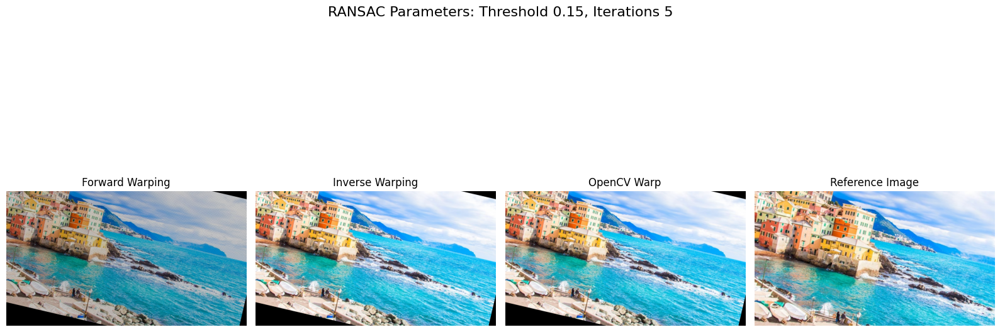

Total number of matches:  6416
Inliers found:            2902
Outliers removed:         3514


<Figure size 640x480 with 0 Axes>

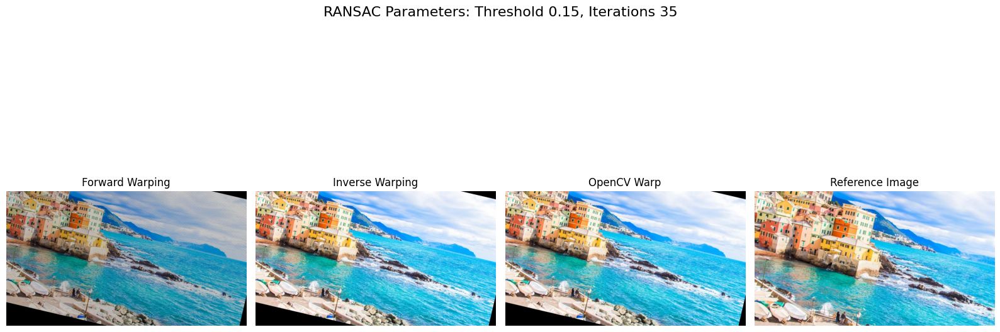

<Figure size 640x480 with 0 Axes>

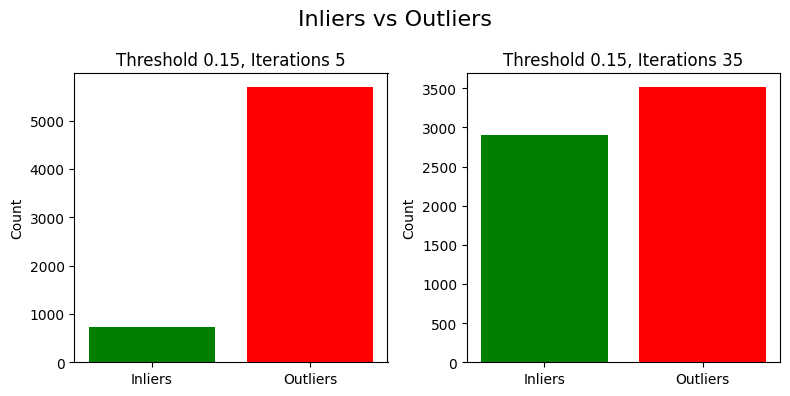

Total number of matches:  6416
Inliers found:            5423
Outliers removed:         993


<Figure size 640x480 with 0 Axes>

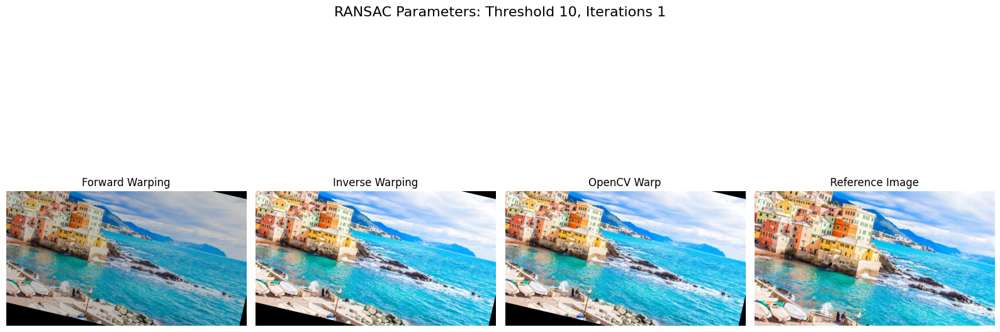

Total number of matches:  6416
Inliers found:            5423
Outliers removed:         993


<Figure size 640x480 with 0 Axes>

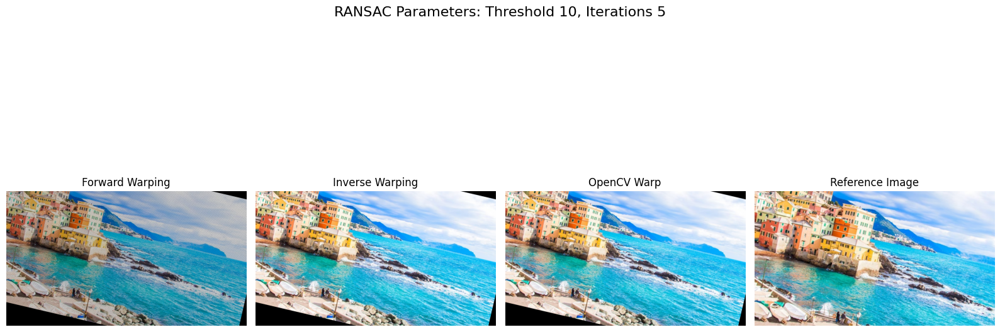

<Figure size 640x480 with 0 Axes>

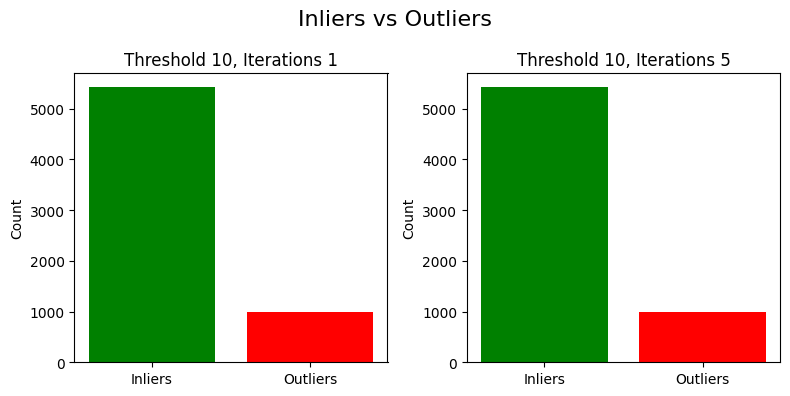

Total number of matches:  6416
Inliers found:            6187
Outliers removed:         229


<Figure size 640x480 with 0 Axes>

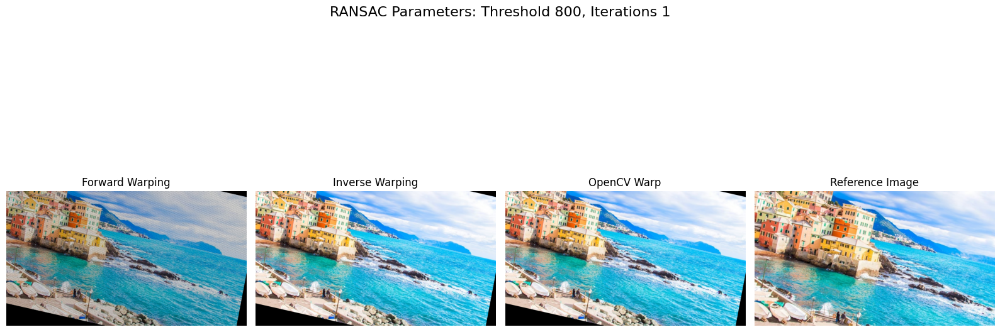

Total number of matches:  6416
Inliers found:            6205
Outliers removed:         211


<Figure size 640x480 with 0 Axes>

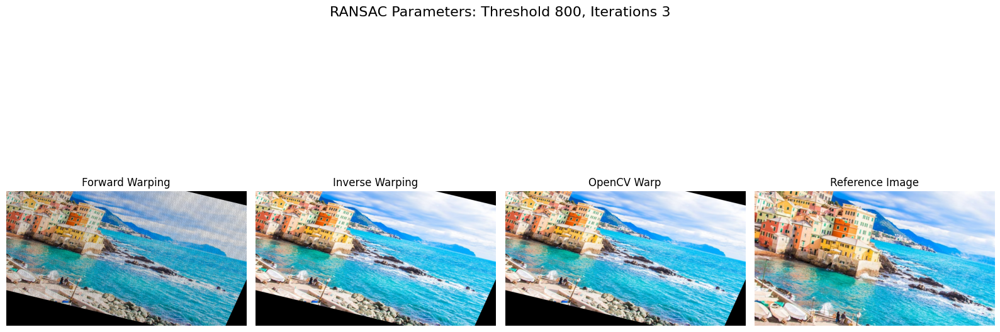

<Figure size 640x480 with 0 Axes>

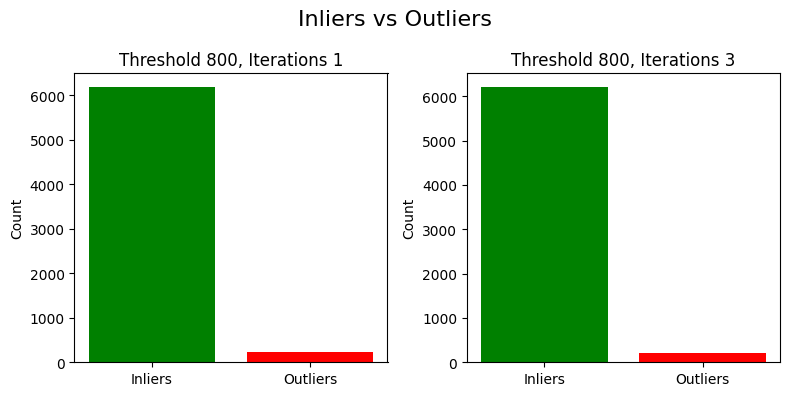

In [23]:
def new_visualize_affine_transformations(source_image, reference_image, threshold, num_iteration, transformation_matrix):
    """
    Compare different affine transformation methods in a 1x4 grid visualization,
    including a plot of inliers and outliers.
    
    Args:
        source_image: Source image to transform.
        reference_image: Reference image to compare against.
        threshold: The threshold for RANSAC inlier selection.
        num_iteration: The number of iterations for RANSAC.
        transformation_matrix: Best transformation matrix found by RANSAC.
        inliers: Inlier points detected in the RANSAC process.
    
    Returns:
        None. Displays a plot without returning a value.
    """
    # forward warp
    forward_wrap_image = apply_affine_transformation(source_image, transformation_matrix)

    # inverse warp
    inverse_wrap_image = apply_affine_transformation(source_image, transformation_matrix, warp_method='inverse')

    # opencv warpAffine
    cv2_wrap_image = cv2.warpAffine(source_image, transformation_matrix, (source_image.shape[1], source_image.shape[0]))

    # Create subplots for visualization
    plt.figure()
    fig, axes = plt.subplots(1, 4, figsize=(16, 8))
    fig.suptitle(f'RANSAC Parameters: Threshold {threshold}, Iterations {num_iteration}', fontsize=16)

    # Display full images
    axes[0].imshow(forward_wrap_image)
    axes[0].set_title('Forward Warping')

    axes[1].imshow(inverse_wrap_image)
    axes[1].set_title('Inverse Warping')

    axes[2].imshow(cv2_wrap_image)
    axes[2].set_title('OpenCV Warp')

    axes[3].imshow(reference_image)
    axes[3].set_title('Reference Image')

    # Hide axis ticks for all subplots
    for ax in axes.flat:
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)

# Example usage
source_image = cv2.cvtColor(cv2.imread("./images/genoa_beach.jpg"), cv2.COLOR_BGR2RGB)
reference_image = cv2.cvtColor(cv2.imread("./images/genoa_beach_cut_1.jpg"), cv2.COLOR_BGR2RGB)

keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(source_image, reference_image)
data = np.array([[keypoints_image_1[match.queryIdx].pt[0], keypoints_image_1[match.queryIdx].pt[1], 
                  keypoints_image_2[match.trainIdx].pt[0], keypoints_image_2[match.trainIdx].pt[1]] 
                  for match in matches])

# Define threshold and iteration ranges
thresholds = [0.15, 10, 800]
num_iterations_list = [[5, 35], [1, 5], [1, 3]]

for threshold, num_iterations in zip(thresholds, num_iterations_list):

    inliers_list = []

    for num_iteration in num_iterations:
        best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations=num_iteration, num_points=3, threshold=threshold)
        inliers = test_affine_transformation_matrix(best_transformation_matrix, data, threshold)
        new_visualize_affine_transformations(source_image, reference_image, threshold, num_iteration, best_transformation_matrix)
        inliers_list.append([len(inliers), threshold, num_iteration])

    plt.figure()
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    fig.suptitle('Inliers vs Outliers', fontsize=16)

    for i, inlier_data  in enumerate(inliers_list):
        num_inliers = inlier_data[0]
        num_outliers = len(matches) - num_inliers
        axes[i].bar(['Inliers', 'Outliers'], [num_inliers, num_outliers], color=['green', 'red'])
        axes[i].set_title(f'Threshold {inlier_data[1]}, Iterations {inlier_data[2]}')
        axes[i].set_ylabel('Count')

    plt.tight_layout()
    plt.show()
    plt.close(fig)

<a id="section-2"></a>
### **Section 2: Image Stitching**

In this section, we will explore the process of image stitching, a technique used to combine multiple images into a single, seamless panorama. This process involves aligning and blending overlapping images to create a larger, cohesive image. By determining the geometric transformation needed to align one image with another, we can map the images to a common coordinate system. Image stitching is widely used in various applications, including photography, computer vision, and virtual reality, where creating wide-angle or high-resolution images from multiple photos is essential.

<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (20 points)</font>

Create a function named **stitch_images_together()** that takes a pair of images as input and returns the stitched result. 

The function should:
- Find the best transformation between the input images using the RANSAC algorithm.
- Estimate the size of the stitched image.
- Transform one image into the coordinate space of the other.
- Combine the transformed image with the other to create a seamless panorama.

Ensure that the function correctly handles both directions—transforming the first image to the coordinate space of the second, and vice versa. The final output should be well-stitched and padded rather than cropped.

**Note:** You can use the `cv2.warpAffine` function to apply the transformation to the images. But you should implement the stitching process yourself **without** using any built-in stitching functions from OpenCV.

In [16]:
def stitch_images_together(image_1, image_2, transformation_matrix):
    """
    Given two input images, stitch image_1 onto image_2.

    Args:
        image_1: The first image (in RGB).
        image_2: The second image (in RGB).
        transformation_matrix: Transformation matrix for image_1 to match image_2

    Returns:
        output_image: The stitched image combining the two input images.
        offset_image_2: Offset of image_2 in the new output image coordinate system.
    """
    
    height_1, width_1 = image_1.shape[:2]
    height_2, width_2 = image_2.shape[:2]

    corners_image_1 = np.array([[0, 0], 
                                [0, height_1], 
                                [width_1, height_1], 
                                [width_1, 0]], dtype=np.float32)
    
    corners_image_2 = np.array([[0, 0], 
                                [0, height_2], 
                                [width_2, height_2], 
                                [width_2, 0]], dtype=np.float32)
    

    transformed_corners_image_1 = cv2.transform(corners_image_1[None,:,:], transformation_matrix)[0]
    
    output_corners = np.vstack((transformed_corners_image_1, corners_image_2))

    min_x, min_y = np.int32(output_corners.min(axis=0))
    max_x, max_y = np.int32(output_corners.max(axis=0))

    output_width = max_x - min_x
    output_height = max_y - min_y

    translation_matrix = np.array([[1, 0, -min_x], 
                                   [0, 1, -min_y],
                                   [0, 0, 1]], dtype=np.float32)

    transformation_matrix = np.array([[transformation_matrix[0, 0], transformation_matrix[0, 1], transformation_matrix[0, 2]],
                                      [transformation_matrix[1, 0], transformation_matrix[1, 1], transformation_matrix[1, 2]],
                                      [0, 0, 1]], dtype=np.float32)

    # Initialize the output image with zeros (black image)
    output_image = np.zeros((output_height, output_width, 3), dtype=image_1.dtype)

    transformed_image_1 = cv2.warpAffine(image_1, (translation_matrix @ transformation_matrix)[:2, :], (output_width, output_height))
    output_image[transformed_image_1 > 0] = transformed_image_1[transformed_image_1 > 0]

    transformed_image_2 = cv2.warpAffine(image_2, translation_matrix[:2, :], (output_width, output_height))
    output_image[transformed_image_2 > 0] = transformed_image_2[transformed_image_2 > 0]

    offset_image_2 = np.array((translation_matrix[0,2], translation_matrix[1,2]), dtype=np.float32)

    return output_image, offset_image_2

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (5 points)</font>

Write code to load the images `genoa_beach_cut_2.jpg` and `genoa_beach_cut_3.jpg`, stitch them together, and visualize the results. First, stitch `genoa_beach_cut_2.jpg` onto `genoa_beach_cut_3.jpg`, then perform the reverse operation by stitching `genoa_beach_cut_3.jpg` onto `genoa_beach_cut_2.jpg`. Visualize both original images and the resulting stitched images.

Finding matching features...
Number of keypoints in the first image:  5787
Number of keypoints in the second image: 5157
Number of matches: 2598
Total number of matches:  2598
Inliers found:            2000
Outliers removed:         598
Finding matching features...
Number of keypoints in the first image:  5157
Number of keypoints in the second image: 5787
Number of matches: 2598
Total number of matches:  2598
Inliers found:            2000
Outliers removed:         598


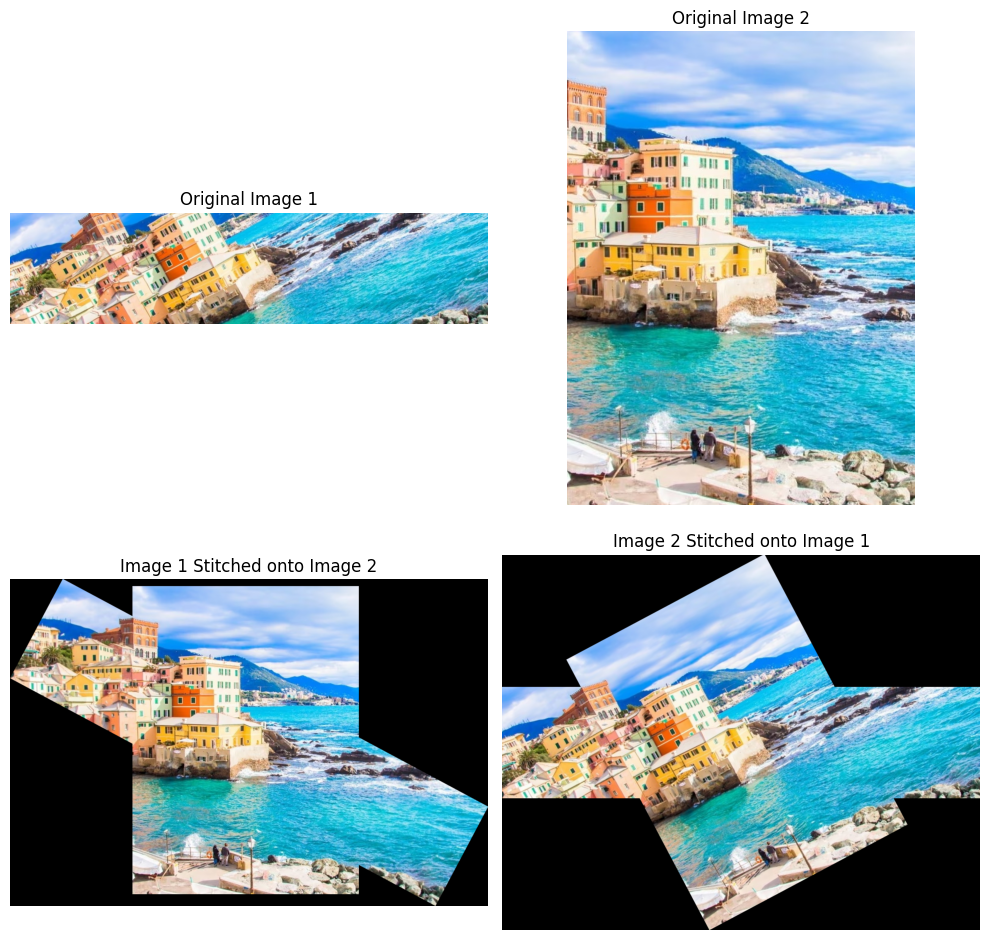

In [17]:
num_iterations = 30
num_points = 3
threshold = 10

image_1_bgr = cv2.imread("./images/genoa_beach_cut_2.jpg")
image_1 = cv2.cvtColor(image_1_bgr, cv2.COLOR_BGR2RGB)

image_2_bgr = cv2.imread("./images/genoa_beach_cut_3.jpg")
image_2 = cv2.cvtColor(image_2_bgr, cv2.COLOR_BGR2RGB)

keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(image_1, image_2)
best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations, num_points, threshold)
output_image_1, offset_image_2 = stitch_images_together(image_1, image_2, best_transformation_matrix)

keypoints_image_2, keypoints_image_1, matches = get_matching_keypoints(image_2, image_1)
best_transformation_matrix = ransac_algorithm(keypoints_image_2, keypoints_image_1, matches, num_iterations, num_points, threshold)
output_image_2, offset_image_1 = stitch_images_together(image_2, image_1, best_transformation_matrix)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))  # Adjust figsize as needed
ax = ax.flatten()

# Plot each image in the respective subplot
ax[0].imshow(image_1)
ax[0].set_title('Original Image 1')
ax[0].axis('off')

ax[1].imshow(image_2)
ax[1].set_title('Original Image 2')
ax[1].axis('off')

ax[2].imshow(output_image_1)
ax[2].set_title('Image 1 Stitched onto Image 2')
ax[2].axis('off')

ax[3].imshow(output_image_2)
ax[3].set_title('Image 2 Stitched onto Image 1')
ax[3].axis('off')

plt.tight_layout()
plt.show()

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (5 points)</font>

Now, write code to load the images `sciencepark_1.jpg` and `sciencepark_2.jpg`, stitch them together, and visualize the results. First, stitch `sciencepark_1.jpg` onto `sciencepark_2.jpg`, then perform the reverse operation by stitching `sciencepark_2.jpg` onto `sciencepark_1.jpg`. Visualize both original images and the resulting stitched images.

Finding matching features...
Number of keypoints in the first image:  10659
Number of keypoints in the second image: 11343
Number of matches: 6218
Total number of matches:  6218
Inliers found:            5476
Outliers removed:         742
Finding matching features...
Number of keypoints in the first image:  11343
Number of keypoints in the second image: 10659
Number of matches: 6218
Total number of matches:  6218
Inliers found:            5475
Outliers removed:         743


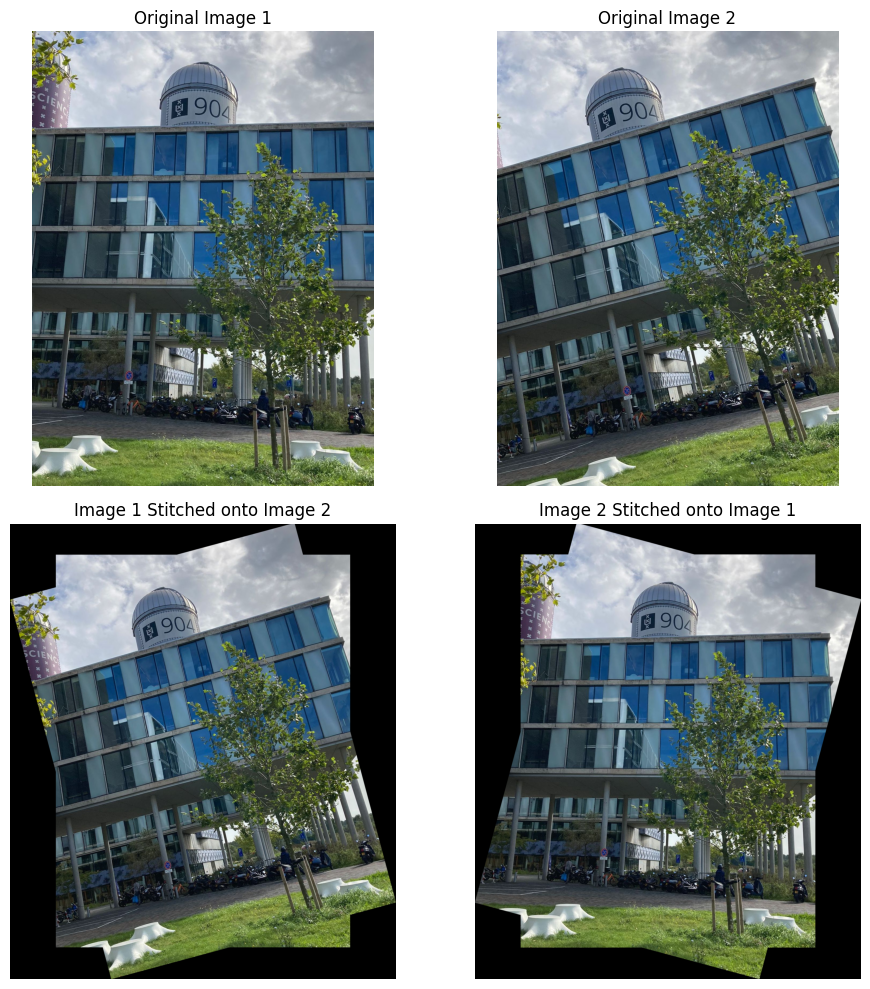

In [18]:
num_iterations = 30
num_points = 3
threshold = 10

image_1_bgr = cv2.imread("./images/sciencepark_1.jpg")
image_1 = cv2.cvtColor(image_1_bgr, cv2.COLOR_BGR2RGB)

image_2_bgr = cv2.imread("./images/sciencepark_2.jpg")
image_2 = cv2.cvtColor(image_2_bgr, cv2.COLOR_BGR2RGB)

keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(image_1, image_2)
best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations, num_points, threshold)
output_image_1, offset_image_2 = stitch_images_together(image_1, image_2, best_transformation_matrix)

keypoints_image_2, keypoints_image_1, matches = get_matching_keypoints(image_2, image_1)
best_transformation_matrix = ransac_algorithm(keypoints_image_2, keypoints_image_1, matches, num_iterations, num_points, threshold)
output_image_2, offset_image_1 = stitch_images_together(image_2, image_1, best_transformation_matrix)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))  # Adjust figsize as needed
ax = ax.flatten()

# Plot each image in the respective subplot
ax[0].imshow(image_1)
ax[0].set_title('Original Image 1')
ax[0].axis('off')

ax[1].imshow(image_2)
ax[1].set_title('Original Image 2')
ax[1].axis('off')

ax[2].imshow(output_image_1)
ax[2].set_title('Image 1 Stitched onto Image 2')
ax[2].axis('off')

ax[3].imshow(output_image_2)
ax[3].set_title('Image 2 Stitched onto Image 1')
ax[3].axis('off')

plt.tight_layout()
plt.show()

<a id="section-3"></a>
### **Section 3: Automatic Panorama Stitching**

In this section, you will create a panorama by stitching together multiple images. The goal is to combine a series of images into a single, wide-angle view that captures the entire scene seamlessly. This process involves detecting features in each image, matching these features between consecutive images, and computing the geometric transformations needed to align and blend them into a cohesive panorama. By mapping the images to a common coordinate system using these transformations, you can effectively stitch them together into one continuous view.

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (15 points)</font>

Create a function named **`automatic_panorama_stitching(images, use_mask=True)`** that stitches a series of images together to create a panorama. The function should accept a list of input images and manually implement the stitching process using feature detection and matching techniques. This includes performing feature matching between images, estimating the homography between matched features, and warping images to align them into a panorama.

The function should handle cases where stitching fails, providing appropriate error messages if necessary. After stitching, and based on the **`use_mask`** parameter, the function should crop the stitched image using the bounding rectangle to remove unnecessary areas, such as black borders.

Apply your function on the image paths provided below and visualize the results for each set of images. Make sure to **also** visualize the difference between **`use_mask`** set to **True** and **False**.

```python
image_paths = [
    'panorama_images/panorama_cut_1.jpg',
    'panorama_images/panorama_cut_2.jpg',
    'panorama_images/panorama_cut_3.jpg',
    'panorama_images/panorama_cut_4.jpg',
]

image_paths = [
    'panorama_images/panorama_2_cut_1.jpg',
    'panorama_images/panorama_2_cut_2.jpg',
    'panorama_images/panorama_2_cut_3.jpg',
    'panorama_images/panorama_2_cut_4.jpg',
    'panorama_images/panorama_2_cut_5.jpg',
    'panorama_images/panorama_2_cut_6.jpg',
    'panorama_images/panorama_2_cut_7.jpg',
    'panorama_images/panorama_2_cut_8.jpg',
]
```

**Note:** You are allowed to use any of the functions you have implemented in the previous sections, but you are also allowed to use any other functions from OpenCV.

In [19]:
def automatic_panorama_stitching(images, use_mask=True):
    """
    Automatically stitch a series of images together to create a panorama with planar projection,
    and optionally apply a mask to crop out black borders.
    
    Args:
        images: A list of input images to stitch together.
        use_mask: A boolean indicating whether to use a mask for the final stitched image. (default is True)

    Returns:
        stitched_image: The final stitched image.
    """

    def check_borders(mask, cropping_mask):
        """
        Check if the current cropping mask still contains black borders.
        
        Args:
            mask: Binary mask of the stitched image.
            cropping_mask: Current cropping rectangle.

        Returns:
            finished: Whether all black borders are removed.
            top, bottom, left, right: Amount to crop on each side.
        """
        sub = mask[cropping_mask[1]:cropping_mask[1] + cropping_mask[3], cropping_mask[0]:cropping_mask[0] + cropping_mask[2]]

        top = int(np.sum(sub[0, :] == 0) > 0)
        bottom = int(np.sum(sub[-1, :] == 0) > 0)
        left = int(np.sum(sub[:, 0] == 0) > 0)
        right = int(np.sum(sub[:, -1] == 0) > 0)

        finished = not (top or bottom or left or right)
        return finished, top, bottom, left, right
    
    # Use the middle image as the base image
    middle_index = len(images) // 2
    base_image = images[middle_index]
    remaining_images = images[middle_index-1::-1] + images[middle_index+1:]

    # Loop over the remaining images to stitch them together
    for i, image in enumerate(remaining_images):
        keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(base_image, image)

        if len(matches) < 10:
            print(f"Insufficient matches found between images. Skipping.")
            continue

        transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations=50, num_points=3, threshold=10)
        stitched_image, _ = stitch_images_together(base_image, image, transformation_matrix)

        base_image = stitched_image

    stitched_image = base_image

    if use_mask:

        gray = cv2.cvtColor(stitched_image, cv2.COLOR_BGR2GRAY)
        _, binary_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

        # Get initial cropping mask from contours
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return stitched_image

        max_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(max_contour)
        cropping_mask = [x, y, w, h]

        # Iteratively remove black borders
        while True:
            finished, top, bottom, left, right = check_borders(binary_mask, cropping_mask)
            if finished:
                break

            cropping_mask[0] += left
            cropping_mask[1] += top
            cropping_mask[2] -= left + right
            cropping_mask[3] -= top + bottom
            
        return stitched_image[cropping_mask[1]:cropping_mask[1] + cropping_mask[3], cropping_mask[0]:cropping_mask[0] + cropping_mask[2]]

    return stitched_image

Finding matching features...
Number of keypoints in the first image:  1519
Number of keypoints in the second image: 1483
Number of matches: 591
Total number of matches:  591
Inliers found:            316
Outliers removed:         275
Finding matching features...
Number of keypoints in the first image:  2569
Number of keypoints in the second image: 1325
Number of matches: 754
Total number of matches:  754
Inliers found:            475
Outliers removed:         279
Finding matching features...
Number of keypoints in the first image:  3038
Number of keypoints in the second image: 1970
Number of matches: 857
Total number of matches:  857
Inliers found:            315
Outliers removed:         542
Finding matching features...
Number of keypoints in the first image:  1519
Number of keypoints in the second image: 1483
Number of matches: 591
Total number of matches:  591
Inliers found:            316
Outliers removed:         275
Finding matching features...
Number of keypoints in the first im

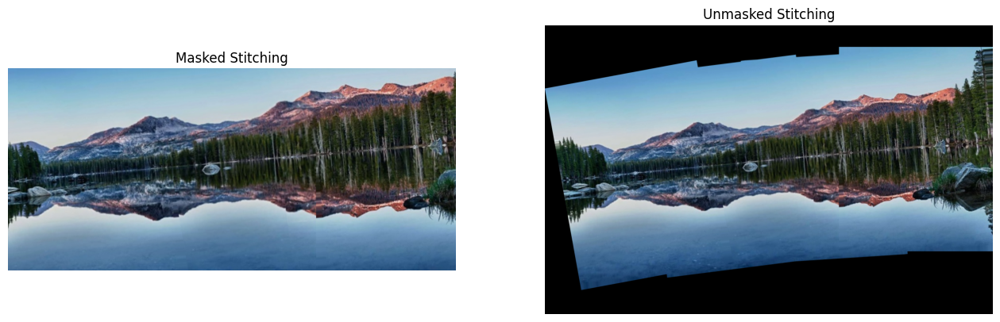

In [22]:
image_paths = [
    'panorama_images/panorama_cut_1.jpg',
    'panorama_images/panorama_cut_2.jpg',
    'panorama_images/panorama_cut_3.jpg',
    'panorama_images/panorama_cut_4.jpg',
]

images = [cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB) for image_path in image_paths]
stitched_image_masked = automatic_panorama_stitching(images, use_mask=True)
stitched_image_unmasked = automatic_panorama_stitching(images, use_mask=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(stitched_image_masked)
axes[0].axis('off')
axes[0].set_title('Masked Stitching')

axes[1].imshow(stitched_image_unmasked)
axes[1].axis('off')
axes[1].set_title('Unmasked Stitching')

plt.show()

Finding matching features...
Number of keypoints in the first image:  8645
Number of keypoints in the second image: 8473
Number of matches: 5509
Total number of matches:  5509
Inliers found:            5096
Outliers removed:         413
Finding matching features...
Number of keypoints in the first image:  10404
Number of keypoints in the second image: 8854
Number of matches: 5821
Total number of matches:  5821
Inliers found:            5326
Outliers removed:         495
Finding matching features...
Number of keypoints in the first image:  12013
Number of keypoints in the second image: 7794
Number of matches: 5554
Total number of matches:  5554
Inliers found:            4968
Outliers removed:         586
Finding matching features...
Number of keypoints in the first image:  12642
Number of keypoints in the second image: 5839
Number of matches: 4612
Total number of matches:  4612
Inliers found:            4166
Outliers removed:         446
Finding matching features...
Number of keypoints 

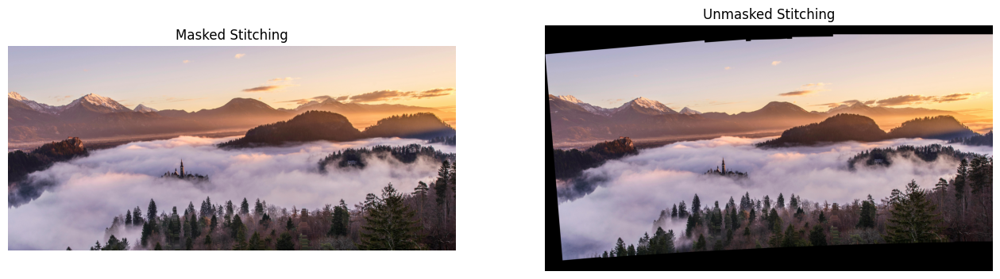

In [21]:
image_paths = [
    'panorama_images/panorama_2_cut_1.jpg',
    'panorama_images/panorama_2_cut_2.jpg',
    'panorama_images/panorama_2_cut_3.jpg',
    'panorama_images/panorama_2_cut_4.jpg',
    'panorama_images/panorama_2_cut_5.jpg',
    'panorama_images/panorama_2_cut_6.jpg',
    'panorama_images/panorama_2_cut_7.jpg',
    'panorama_images/panorama_2_cut_8.jpg',
]

images = [cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB) for image_path in image_paths]
stitched_image_masked = automatic_panorama_stitching(images, use_mask=True)
stitched_image_unmasked = automatic_panorama_stitching(images, use_mask=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(stitched_image_masked)
axes[0].axis('off')
axes[0].set_title('Masked Stitching')

axes[1].imshow(stitched_image_unmasked)
axes[1].axis('off')
axes[1].set_title('Unmasked Stitching')

plt.show()

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Jose | 33 % | 33 % | 33 % |
| Lisanne | 33 % | 33 % | 33 % |
| Julio | 33 % | 33 % | 33 % |

### - End of Notebook -